###              CUSTOMER ATTRITION PREDICTION MODEL FOR CELL PHONE SERVICE COMPANY

### Load the required libraries

In [1]:

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling
import plotly.offline as po
import plotly.graph_objs as go
%matplotlib inline

## Understanding of variables

In [2]:
# perform Exploratory Data Analysis in just one line of code
pandas_profiling.ProfileReport(pd.read_csv("Case_Study_Data.csv"))

#scroll down this report to get variable understanding

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
#Import Customer attrition Dataset
attrition_dataset=pd.read_csv('Case_Study_Data.csv')

In [4]:
#number of columns and rows in the dataset
attrition_dataset.shape

(3331, 14)

In [5]:
#convert string values (yes/no) of the Customer_Attrition column to 1 and 0
attrition_dataset.loc[attrition_dataset.Customer_Attrition=='No','Customer_Attrition']=0
attrition_dataset.loc[attrition_dataset.Customer_Attrition=='Yes','Customer_Attrition']=1

### Missing values treatment

In [6]:
attrition_dataset.isnull().sum()

Sno                       0
Customer_ID               5
Weeks                     3
Contract_Renewal          9
Data_Plan                 4
Data_Usage                1
Calls_To_Customer_Care    1
DayMins                   2
DayCalls                  1
MonthlyCharge             2
OverageFee                1
RoamMins                  1
Customer_Attrition        1
Inserted_Date             0
dtype: int64

In [7]:
attrition_dataset.shape

(3331, 14)

In [8]:
attrition_dataset.head()




,Sno,Customer_ID,Weeks,Contract_Renewal,Data_Plan,Data_Usage,Calls_To_Customer_Care,DayMins,DayCalls,MonthlyCharge,OverageFee,RoamMins,Customer_Attrition,Inserted_Date
0,1,2951997.0,57.0,1.0,1.0,2.57,0.0,213.0,115.0,78.7,9.56,9.5,0,05/01/2012
1,2,2461448.0,54.0,1.0,0.0,0.00,3.0,134.3,73.0,37.0,7.78,14.7,0,05/01/2012
2,3,3573953.0,20.0,1.0,0.0,0.32,0.0,190.0,109.0,58.2,12.91,6.3,0,05/01/2012
3,4,728293.0,49.0,1.0,0.0,0.21,1.0,119.3,117.0,41.1,10.76,11.1,0,05/01/2012
4,5,6987894.0,142.0,1.0,0.0,0.00,2.0,84.8,95.0,27.0,6.84,14.2,0,05/01/2012


In [9]:
attrition_dataset.dropna(subset=['DayMins','MonthlyCharge',"Customer_ID",'Weeks','Contract_Renewal','Data_Plan','Data_Usage','Calls_To_Customer_Care','DayCalls',"OverageFee"
                                ,"RoamMins",'Customer_Attrition'],inplace=True)



In [10]:
attrition_dataset.isnull().sum()

Sno                       0
Customer_ID               0
Weeks                     0
Contract_Renewal          0
Data_Plan                 0
Data_Usage                0
Calls_To_Customer_Care    0
DayMins                   0
DayCalls                  0
MonthlyCharge             0
OverageFee                0
RoamMins                  0
Customer_Attrition        0
Inserted_Date             0
dtype: int64

In [11]:
attrition_dataset.shape

(3311, 14)

In [12]:
# replace all the space with null values
attrition_dataset['Contract_Renewal']=attrition_dataset['Contract_Renewal'].replace(" ",np.nan)
attrition_dataset['Data_Plan']=attrition_dataset['Data_Plan'].replace(" ",np.nan)

#Drop null values of both features
attrition_dataset=attrition_dataset[attrition_dataset['Contract_Renewal'].notnull()]
attrition_dataset=attrition_dataset.reset_index()[attrition_dataset.columns]

attrition_dataset=attrition_dataset[attrition_dataset['Data_Plan'].notnull()]
attrition_dataset=attrition_dataset.reset_index()[attrition_dataset.columns]


In [13]:
attrition_dataset['Customer_Attrition'].value_counts().values

array([2831,  480], dtype=int64)

## Data exploration and visualization

In [14]:
# Visualize Total customer attrition

plot_by_attrition_labels = attrition_dataset['Customer_Attrition'].value_counts().keys().tolist()
plot_by_attrition_values =attrition_dataset['Customer_Attrition'].value_counts().values.tolist()

plot_data= [
    go.Pie(labels = plot_by_attrition_labels,
           values = plot_by_attrition_values,
           marker = dict(colors =  [ 'Teal' ,'Grey'],
                         line = dict(color = "white",
                                     width =  1.5)),
           rotation = 90,
           hoverinfo = "label+value+text",
           hole = .6)
]
plot_layout = go.Layout(dict(title = "Customer Attrition",
                   plot_bgcolor  = "rgb(243,243,243)",
                   paper_bgcolor = "rgb(243,243,243)",))


fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '0.0'),
  Text(1, 0, '1.0'),
  Text(2, 0, '2.0'),
  Text(3, 0, '3.0'),
  Text(4, 0, '4.0'),
  Text(5, 0, '5.0'),
  Text(6, 0, '6.0'),
  Text(7, 0, '7.0'),
  Text(8, 0, '8.0'),
  Text(9, 0, '9.0')])

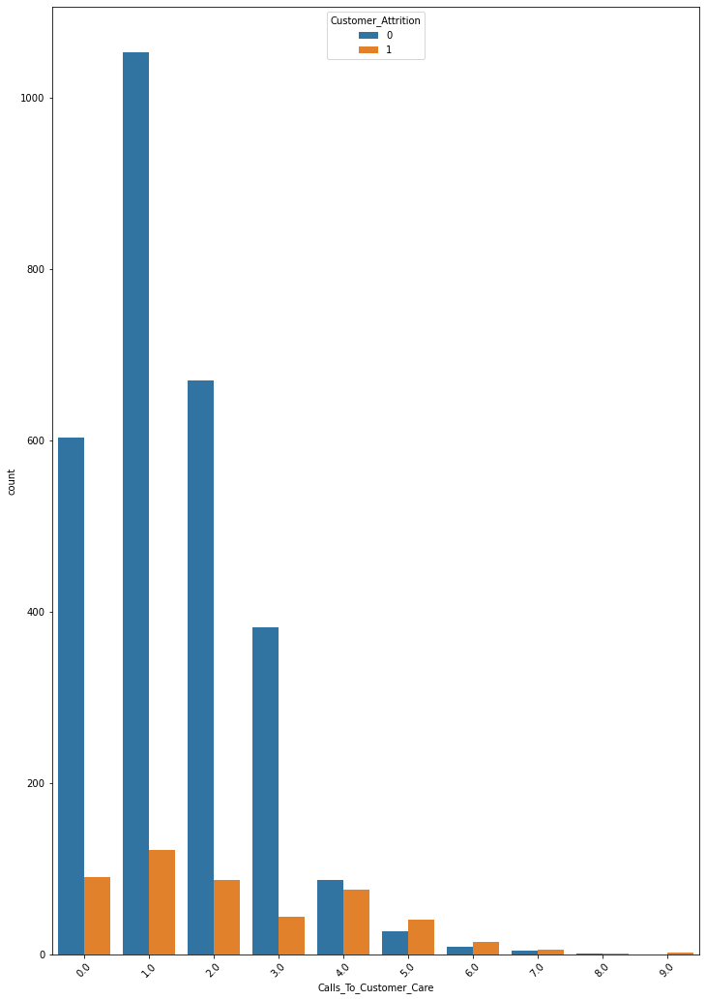

In [15]:
# Visualize Customer_Attrition Rate by Calls_To_Customer_Care
fig,ax=plt.subplots(figsize=(12,18))
sns.countplot(x="Calls_To_Customer_Care",hue="Customer_Attrition", data=attrition_dataset,ax=ax)
plt.xticks(rotation=45)

(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.,  6.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

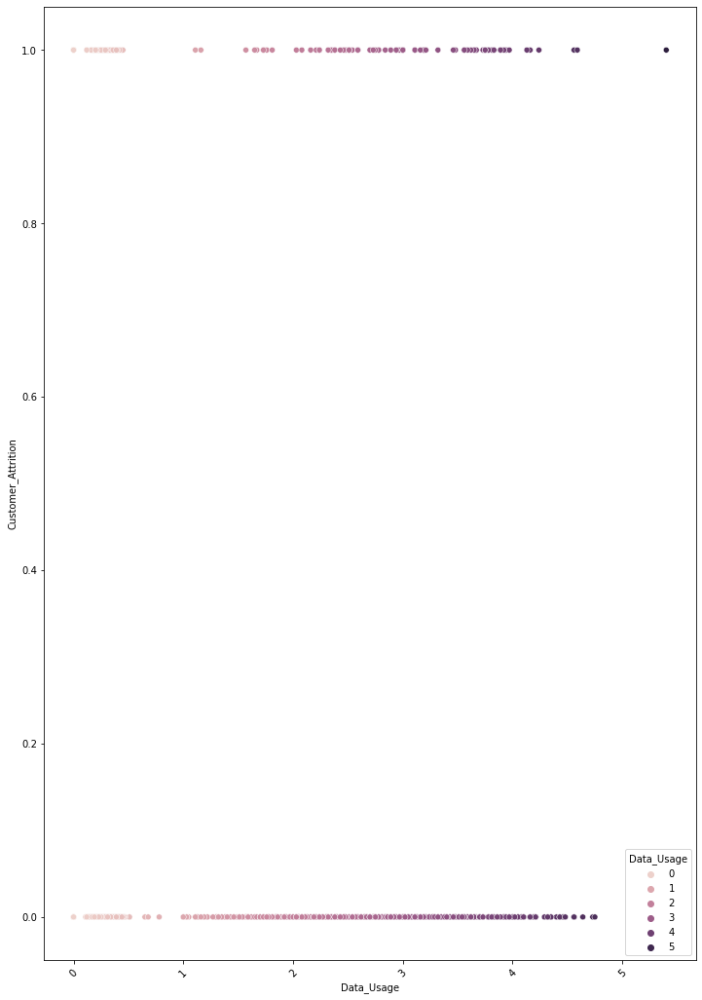

In [16]:
# Visualize Customer_Attrition Rate by Data_Usage by scatter plot
fig,ax=plt.subplots(figsize=(12,18))
sns.scatterplot(y="Customer_Attrition",x="Data_Usage",hue="Data_Usage", data=attrition_dataset)
plt.xticks(rotation=45)

(array([0, 1]), [Text(0, 0, '0.0'), Text(1, 0, '1.0')])

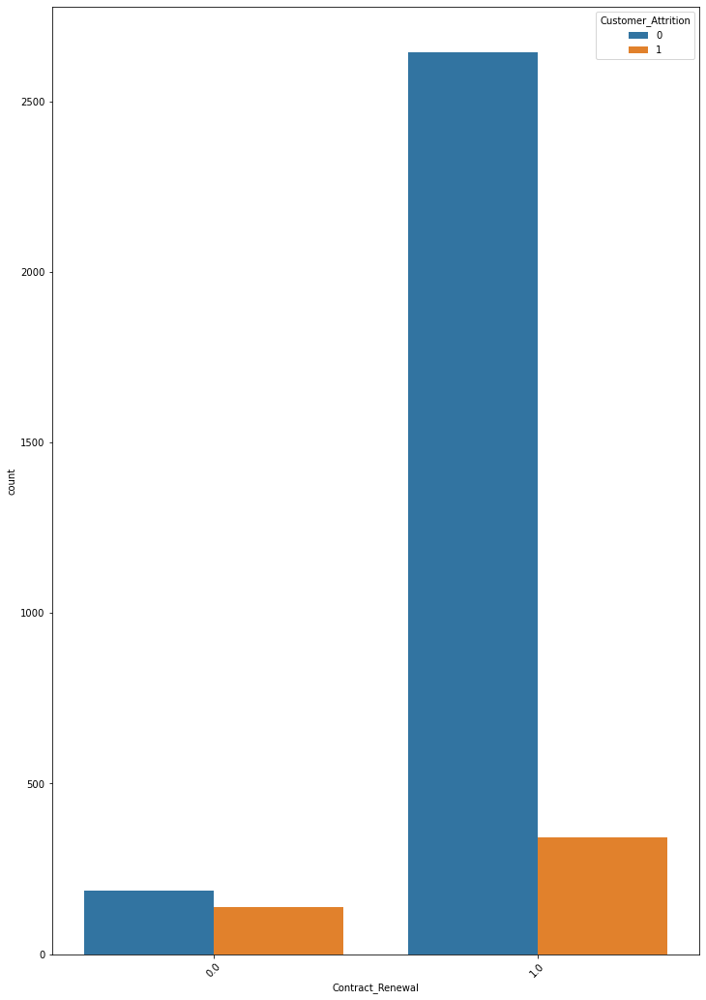

In [17]:
# Visualize Customer_Attrition Rate by Contract_Renewal
fig,ax=plt.subplots(figsize=(12,18))
sns.countplot(x="Contract_Renewal",hue="Customer_Attrition", data=attrition_dataset)
plt.xticks(rotation=45)

(array([0, 1]), [Text(0, 0, '0.0'), Text(1, 0, '1.0')])

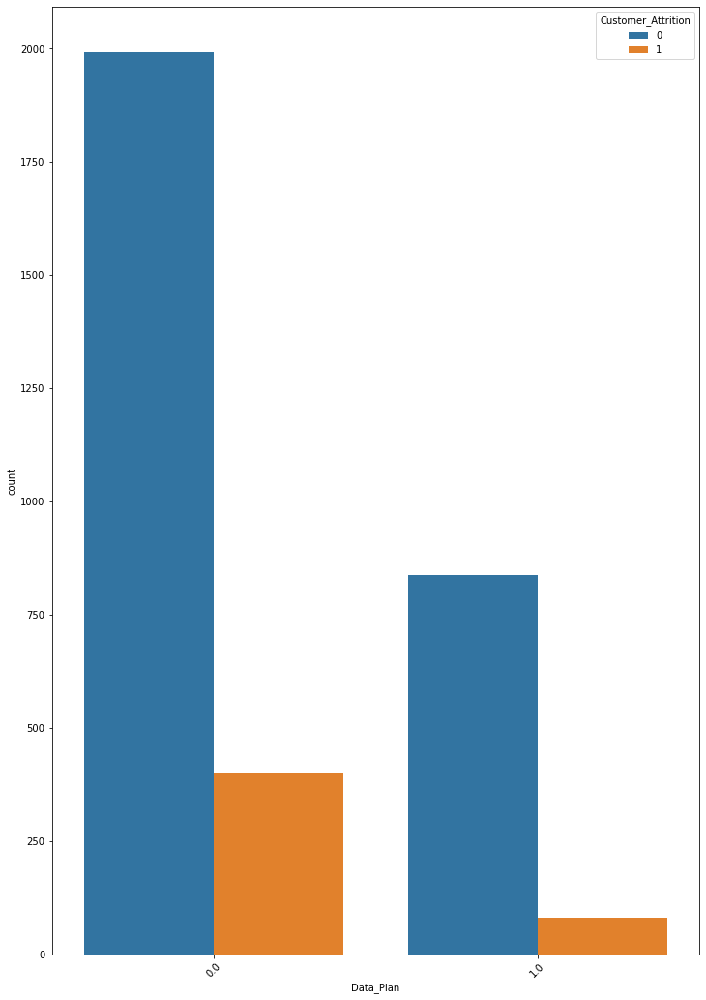

In [18]:
# Visualize Customer_Attrition Rate by Contract_Renewal
fig,ax=plt.subplots(figsize=(12,18))
sns.countplot(x="Data_Plan",hue="Customer_Attrition", data=attrition_dataset)
plt.xticks(rotation=45)

### Visualising Every feature


Now time to use pair plot, it is a scatter plot of each numeric coloumn with all other numeric coloumn including itself.
It is a quick way to visualize numeric coloumns and any underlying patterns

To create a pair plots you need to identify all numeric coloumns. 
Once done you can use pair plot function.

You will create the pair plots for 12 numeric coloumn for simplicity (leaving customer id and s.no.)





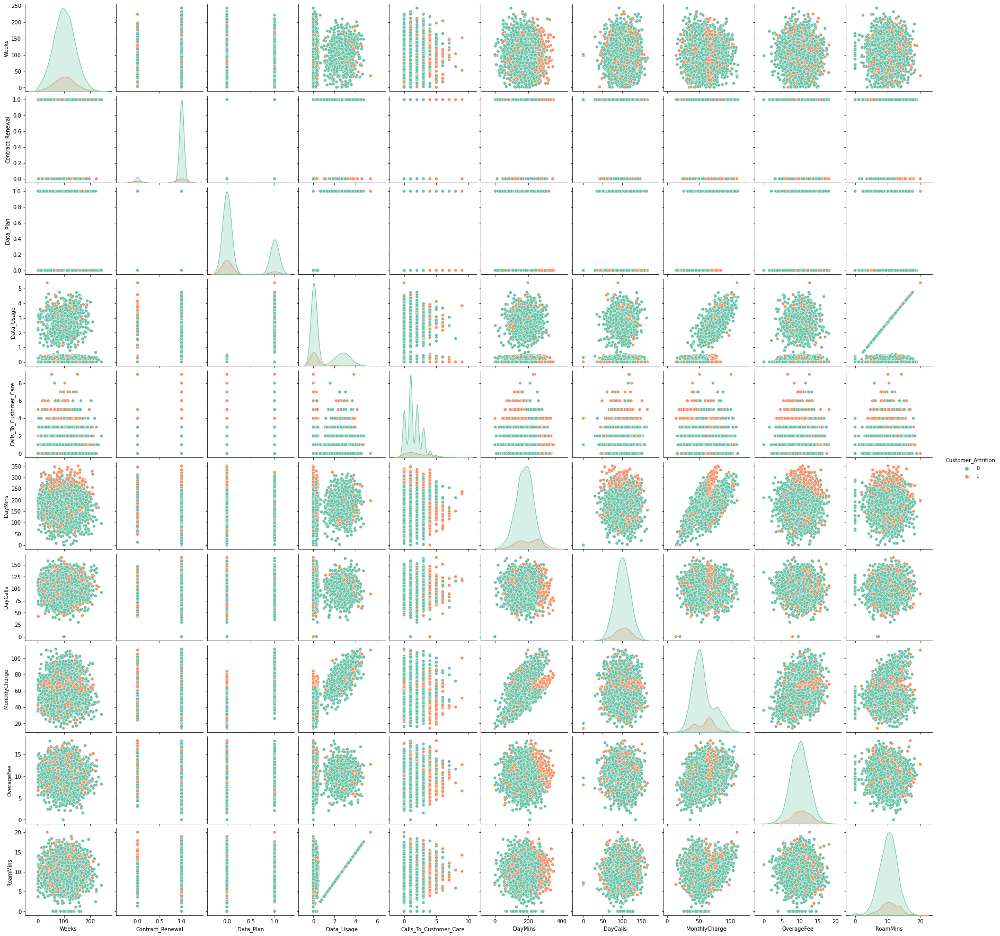

In [19]:
numeric_cols= attrition_dataset.select_dtypes(include=np.number).columns.tolist()
sns.pairplot(attrition_dataset, vars=numeric_cols[2:15], hue="Customer_Attrition",palette="Set2")


You will see a 12 * 12 matrix of plots with each numeric column plotted against every numeric column.
the plots are brokendown by the Customer_Attrition to see any patterns.. 

we see that those who have more day calls , calls less to customer care.
And those who have charged more Overage fee are more on attrition.

And those who have less roam mins are not in attrition. 
Those who have more monthly charges is more on attrition.

You can double click to zoom in it.

### Feature engineering

In [20]:
#As inserted date column can't be converted in to float data type or int as it is string. So We can remove this feature.
del attrition_dataset['Inserted_Date']

In [21]:
attrition_dataset.head()

,Sno,Customer_ID,Weeks,Contract_Renewal,Data_Plan,Data_Usage,Calls_To_Customer_Care,DayMins,DayCalls,MonthlyCharge,OverageFee,RoamMins,Customer_Attrition
0,1,2951997.0,57.0,1.0,1.0,2.57,0.0,213.0,115.0,78.7,9.56,9.5,0
1,2,2461448.0,54.0,1.0,0.0,0.00,3.0,134.3,73.0,37.0,7.78,14.7,0
2,3,3573953.0,20.0,1.0,0.0,0.32,0.0,190.0,109.0,58.2,12.91,6.3,0
3,4,728293.0,49.0,1.0,0.0,0.21,1.0,119.3,117.0,41.1,10.76,11.1,0
4,5,6987894.0,142.0,1.0,0.0,0.00,2.0,84.8,95.0,27.0,6.84,14.2,0


In [22]:

#Performing One Hot Encoding using get_dummies method
#Doing this for categorical values only.

attrition_dataset = pd.get_dummies(attrition_dataset, columns = ['Contract_Renewal','Data_Plan'],
                              drop_first=True)

In [23]:
##Perform Feature Scaling and One Hot Encoding (To scaling all the values in same type)
from sklearn.preprocessing import StandardScaler

#Perform Feature Scaling on 'tenure', 'MonthlyCharges', 'TotalCharges' in order to bring them on same scale
standardScaler = StandardScaler()
columns_for_ft_scaling = [ 'Weeks','Contract_Renewal_1.0','MonthlyCharge', 'OverageFee']

#Apply the feature scaling operation on dataset using fit_transform() method
attrition_dataset[columns_for_ft_scaling] = standardScaler.fit_transform(attrition_dataset[columns_for_ft_scaling])

In [24]:
attrition_dataset.head()

,Sno,Customer_ID,Weeks,Data_Usage,Calls_To_Customer_Care,DayMins,DayCalls,MonthlyCharge,OverageFee,RoamMins,Customer_Attrition,Contract_Renewal_1.0,Data_Plan_1.0
0,1,2951997.0,-1.103992,2.57,0.0,213.0,115.0,1.361685,-0.194089,9.5,0,0.32822,1
1,2,2461448.0,-1.179176,0.00,3.0,134.3,73.0,-1.174482,-0.898485,14.7,0,0.32822,0
2,3,3573953.0,-2.031255,0.32,0.0,190.0,109.0,0.114888,1.131599,6.3,0,0.32822,0
3,4,728293.0,-1.304482,0.21,1.0,119.3,117.0,-0.925123,0.280784,11.1,0,0.32822,0
4,5,6987894.0,1.026205,0.00,2.0,84.8,95.0,-1.782676,-1.270469,14.2,0,0.32822,0


In [25]:
attrition_dataset.columns

Index(['Sno', 'Customer_ID', 'Weeks', 'Data_Usage', 'Calls_To_Customer_Care',
       'DayMins', 'DayCalls', 'MonthlyCharge', 'OverageFee', 'RoamMins',
       'Customer_Attrition', 'Contract_Renewal_1.0', 'Data_Plan_1.0'],
      dtype='object')

In [26]:
#Create Feature variable X and Target variable y
y = attrition_dataset['Customer_Attrition']
X = attrition_dataset.drop(['Customer_Attrition','Customer_ID'], axis = 1)

In [27]:

#Split the data into training set (70%) and test set (30%)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 50)

In [28]:
# Machine Learning classification model libraries
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

## Model evaluation and interpretation
### Fit the logistic Regression Model

In [29]:
y_train.unique()


array([0, 1], dtype=object)

In [30]:
y_train.head()

403     0
142     0
2527    1
1844    0
832     0
Name: Customer_Attrition, dtype: object

In [31]:
X_train.columns

Index(['Sno', 'Weeks', 'Data_Usage', 'Calls_To_Customer_Care', 'DayMins',
       'DayCalls', 'MonthlyCharge', 'OverageFee', 'RoamMins',
       'Contract_Renewal_1.0', 'Data_Plan_1.0'],
      dtype='object')

In [32]:
X_train.head()

,Sno,Weeks,Data_Usage,Calls_To_Customer_Care,DayMins,DayCalls,MonthlyCharge,OverageFee,RoamMins,Contract_Renewal_1.0,Data_Plan_1.0
403,410,1.352000,0.00,1.0,190.3,123.0,0.102724,1.986371,8.0,0.32822,0
142,146,-1.905949,0.14,3.0,119.3,87.0,-0.967696,0.209553,10.5,0.32822,0
2527,2548,0.750533,0.00,1.0,131.6,95.0,-1.113663,-0.427569,15.5,0.32822,0
1844,1865,1.126450,0.00,3.0,205.4,101.0,-0.566289,-1.306085,10.3,0.32822,0
832,846,1.201633,2.94,1.0,206.7,79.0,1.404258,-0.522544,10.9,0.32822,1


In [33]:
X_train.describe()

,Sno,Weeks,Data_Usage,Calls_To_Customer_Care,DayMins,DayCalls,MonthlyCharge,OverageFee,RoamMins,Contract_Renewal_1.0,Data_Plan_1.0
count,2317.000000,2317.000000,2317.000000,2317.000000,2317.000000,2317.000000,2317.000000,2317.000000,2317.000000,2317.000000,2317.000000
mean,1668.996547,-0.000058,0.831610,1.553733,179.819853,100.592577,0.009813,0.002265,10.296375,0.000483,0.281398
std,952.624998,0.995910,1.285764,1.294762,54.833266,20.027630,1.004276,0.995895,2.770679,0.999558,0.449778
min,1.000000,-2.507417,0.000000,0.000000,0.000000,0.000000,-2.573327,-3.977247,0.000000,-3.046737,0.000000
25%,862.000000,-0.677953,0.000000,1.000000,143.700000,88.000000,-0.687927,-0.680835,8.500000,0.328220,0.000000
50%,1669.000000,-0.001302,0.000000,1.000000,179.900000,101.000000,-0.140553,-0.000183,10.400000,0.328220,0.000000
75%,2475.000000,0.650288,1.860000,2.000000,216.900000,114.000000,0.637935,0.680469,12.100000,0.328220,1.000000
max,3330.000000,3.557381,4.750000,8.000000,350.800000,165.000000,3.344396,3.221041,18.900000,0.328220,1.000000


In [34]:
#Fiting the Support Vector Machine Model
y_train = y_train.astype('int64')
y_test = y_test.astype('int64')
svcmodel = SVC(kernel='linear', random_state=50, probability=True)
svcmodel.fit(X_train,y_train)

#Predict the value for new, unseen data
svc_pred = svcmodel.predict(X_test)

# Find Accuracy using accuracy_score method
svc_accuracy = round(metrics.accuracy_score(y_test, svc_pred) * 100, 2)


##NOTE: It will take time to fit in the model (approx:10 -15min)

In [36]:

# checking model accuracy
Model_Accuracy = pd.DataFrame({
    'Model': [ 'Support Vector Machine'],
    'Score': [ svc_accuracy]})
Model_Accuracy_df = Model_Accuracy.sort_values(by='Score', ascending=False)
Model_Accuracy_df  = Model_Accuracy_df.set_index('Score')
Model_Accuracy_df.reset_index()

,Score,Model
0,86.62,Support Vector Machine


In [37]:
#Generate confusion matrix for Support Vector Machine model as Accuracy is good.
from sklearn.metrics import confusion_matrix
conf_mat_svcmodel = confusion_matrix(y_test,svc_pred)
conf_mat_svcmodel

array([[841,  14],
       [119,  20]], dtype=int64)

In [38]:
# Predicting the probability of Attrition of each customer

attrition_dataset['Probability_of_Attrition'] = svcmodel.predict_proba(attrition_dataset[X_test.columns])[:,1]

In [39]:

# Creating a Dataframe showcasing probability of Attrition of each customer

df_Attrition_proba =attrition_dataset[['Customer_ID','Probability_of_Attrition']]
df_Attrition_proba.head(50)

,Customer_ID,Probability_of_Attrition
0,2951997.0,0.113170
1,2461448.0,0.192452
2,3573953.0,0.167708
3,728293.0,0.121775
4,6987894.0,0.079585
5,3583698.0,0.268763
6,4811970.0,0.198008
7,7175494.0,0.443683
8,3294209.0,0.070235
9,5993656.0,0.319558


So by this we can see the probablity of attrition of each customer side-by-side,
as 1st person has 11.3% probability to attrit
and 11 th person has 6% ofprobablity whereas 
40th person has 59.5 % of probablity to attrit. This means that 40th person will attrit out anytime in future, so there is an opportunity to engage with them/interact with them and if possible give them new offers an incentives associated with new products you have, so that the can stay longer with you.

And if you think customer is anyway goint to leave you no need to spend your valuable budget on them.


C:\Users\BHAVIT JAIN\ANACONDA\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Probability_of_Attrition', ylabel='Density'>

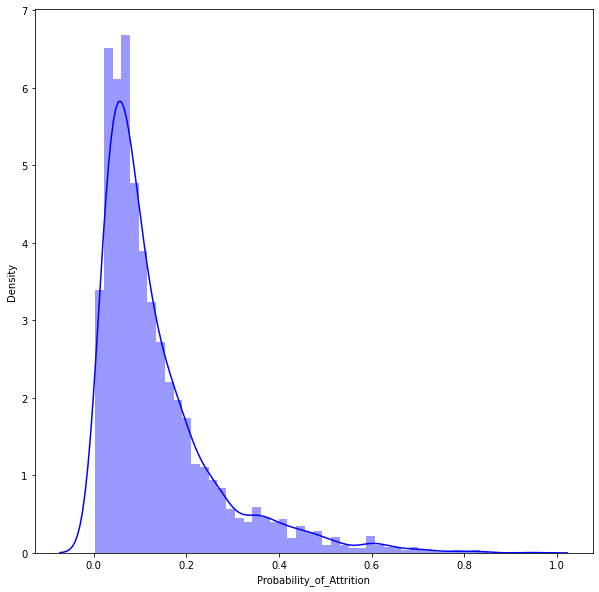

In [40]:
#Probability_of_Attrition distribution plot of the Cell phone service company.

plt.figure(figsize=(10,10))
sns.distplot(df_Attrition_proba['Probability_of_Attrition'], color ='blue')

So this all the Attrition prediction model for call centre company's customers.

# THANK YOU !!